In [2]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
subjectsWitten = np.unique(dfAll[dfAll['lab'] == 'wittenlab']['subject'])
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
colorsStates = ['darkblue','forestgreen','darkorange','purple']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
colormap = ['rebeccapurple','teal','darkturquoise','springgreen']

# Sigma 1D Analysis 

In [3]:
# read from cluster array in order to get parallelizations
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
L2penaltyW = 1
priorDirP = None
maxiter = 300
splitFolds = 5

D = 4 # number of features
sessStop = -1 # last session to use in fitting

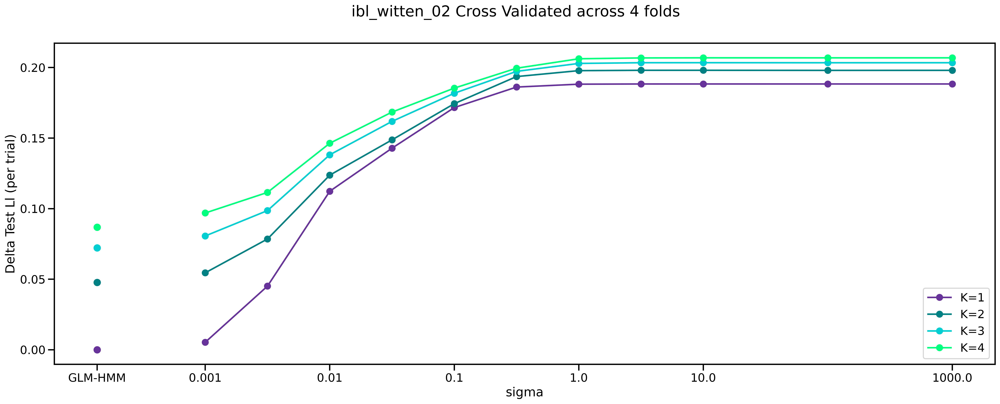

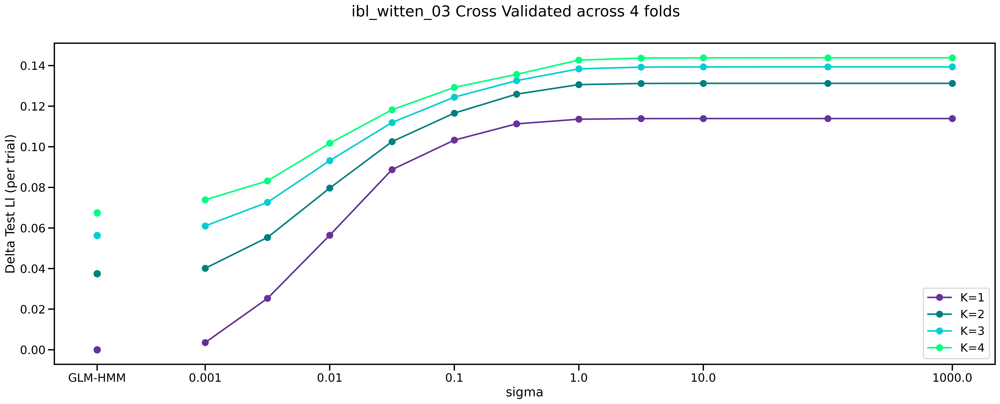

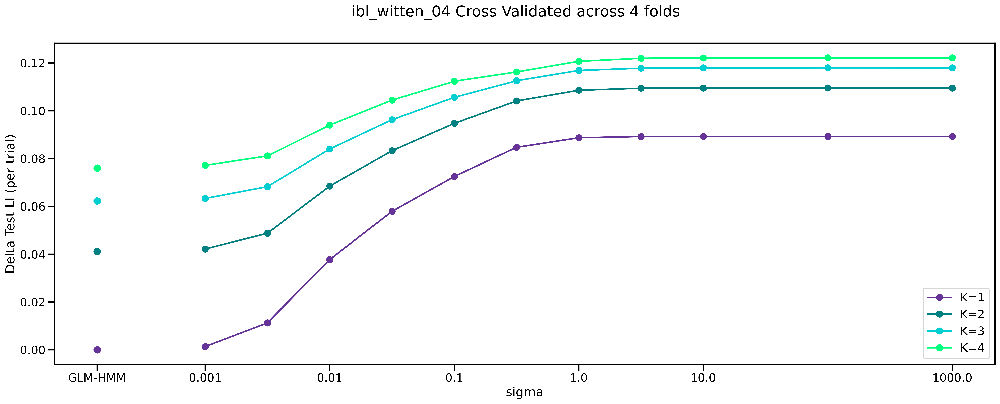

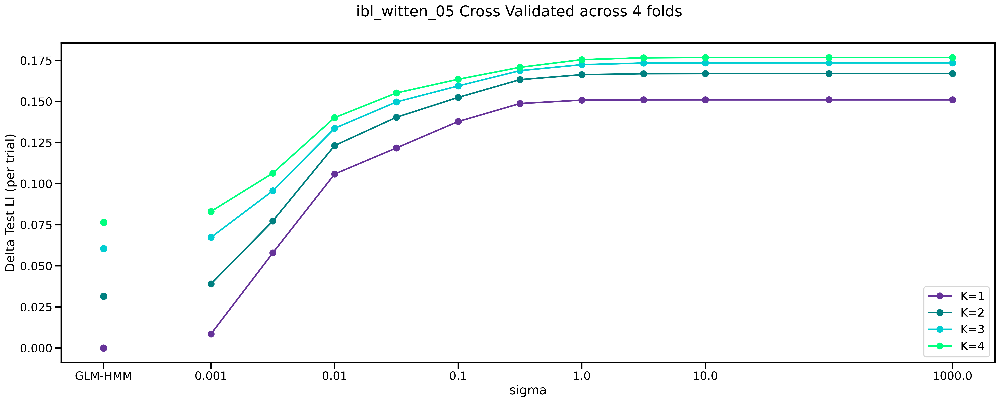

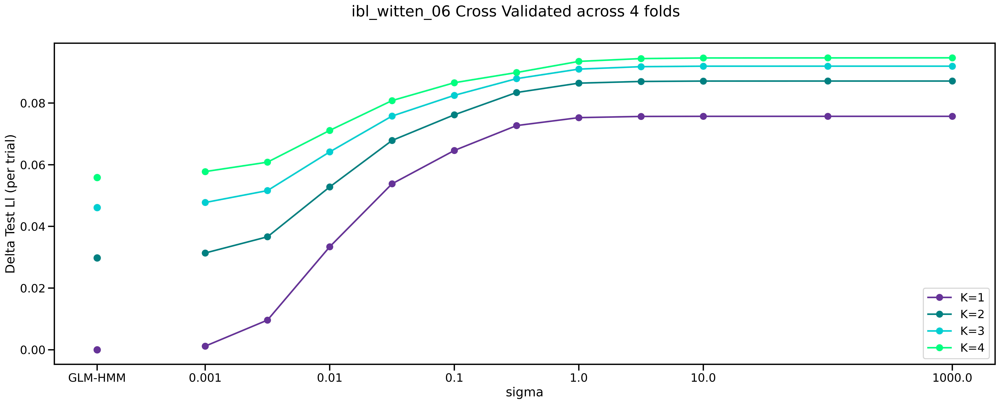

...

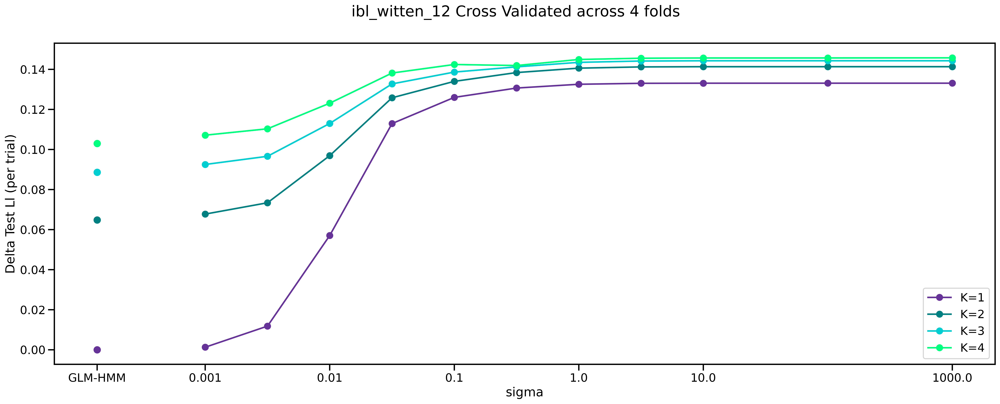

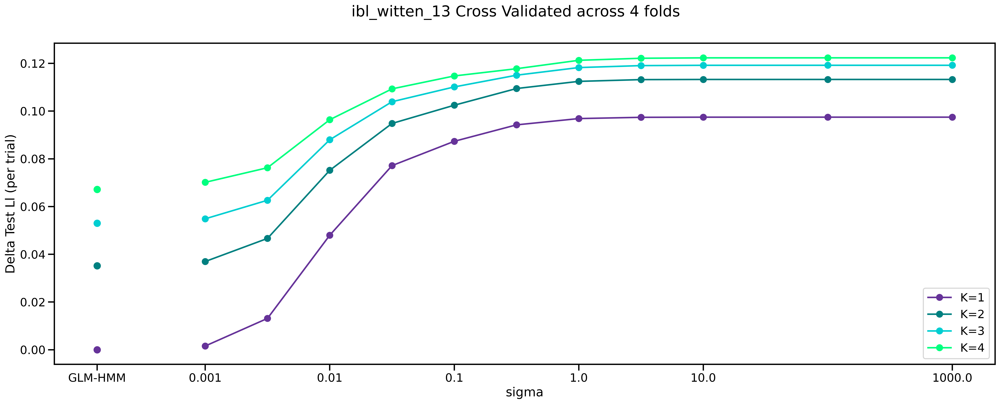

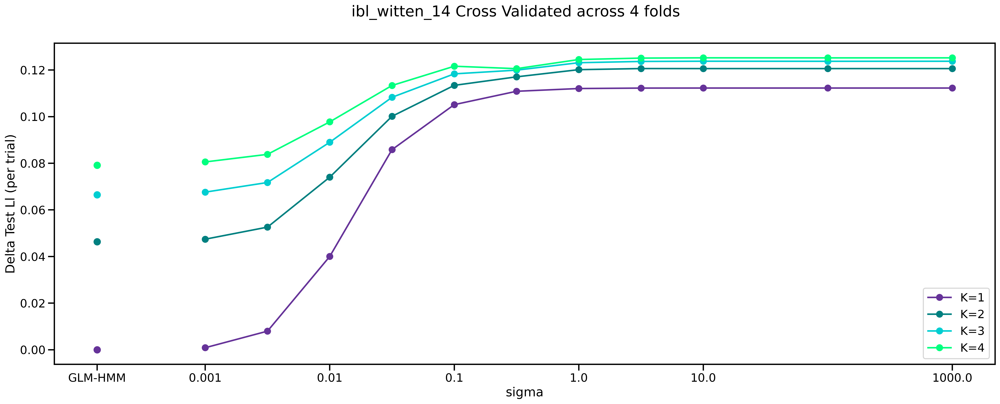

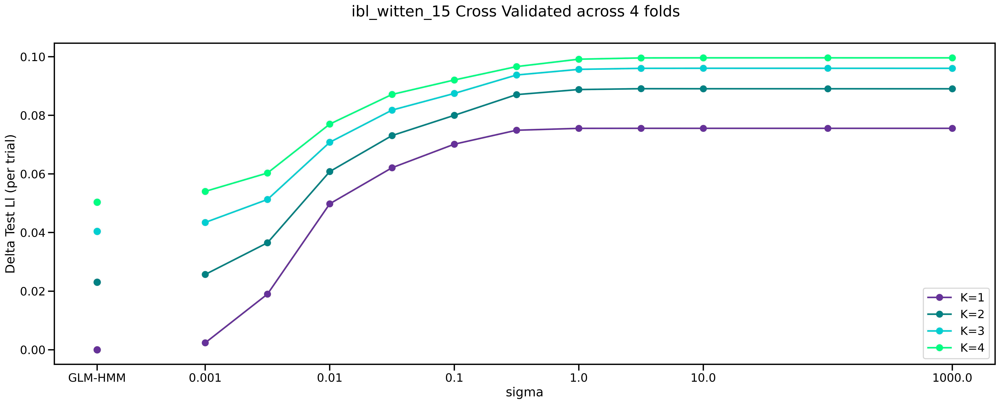

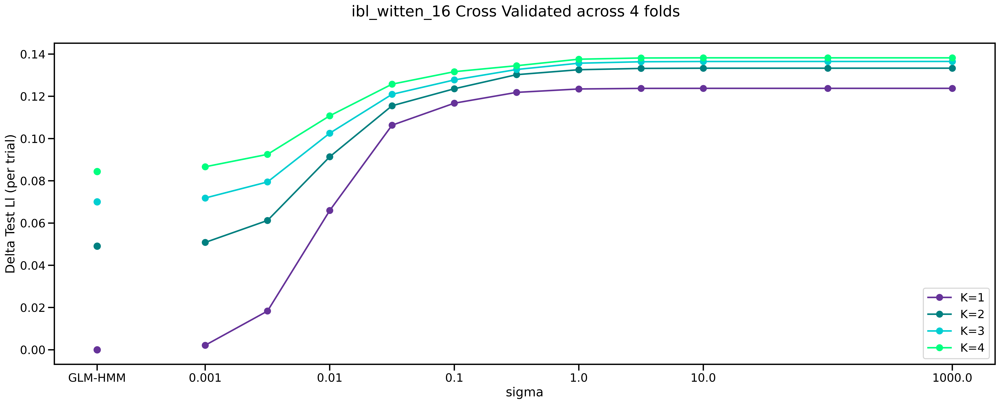

In [5]:
testLlAll = np.empty((4, len(subjectsWitten), len(sigmaList)))
bestTestLl = np.zeros((4,11))
bestTestAccuracy = np.zeros((4,11))

for idx in range(0, len(subjectsWitten)):
    subject = subjectsWitten[idx]
    testLl = []
    testAccuracy = []
    avgTestLl = []
    avgTestAccuracy = []
    for K in [1,2,3,4]:
        for fold in range(0, splitFolds):
            testLl.append(np.load(f'../data_IBL/{subject}/{subject}_testLl_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            testAccuracy.append(np.load(f'../data_IBL/{subject}/{subject}_testAccuracy_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
        avgTestLl.append(np.mean(testLl[:],axis=0))
        avgTestAccuracy.append(np.mean(testAccuracy[:],axis=0))
    avgTestLl = [x - avgTestLl[0][0] for x in avgTestLl] # normalizing to GLM-HMM sigma=0 K=1
    avgTestAccuracy = [x - avgTestAccuracy[0][0] for x in avgTestAccuracy]
    
    for K in [1,2,3,4]:
        testLlAll[K-1][idx] = avgTestLl[K-1]

    bestSigmaInd = 7 # Choosing best sigma index across animals
    for K in [1,2,3,4]:
        bestTestLl[K-1][idx] = avgTestLl[K-1][bestSigmaInd] - avgTestLl[0][bestSigmaInd] # delta
        bestTestAccuracy[K-1][idx] = avgTestAccuracy[K-1][bestSigmaInd] - avgTestAccuracy[0][bestSigmaInd] # delta

    # # Plotting each fold indiviudally for per-animal plots
    # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
    # fig.suptitle(f'{subject}')
    # for K in range(1,5):
    #     for fold in range(0, splitFolds):
    #         plot_testLl_CV_sigma(testLl[splitFolds*(K-1)+fold], sigmaList=sigmaList, label=f'K={K} fold {fold}', color=colormap[K-1], axes=axes)
    
    # Plotting delta test ll averaged across folds for per-animal plots
    fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
    fig.suptitle(f'{subject} Cross Validated across 4 folds')
    fig.tight_layout()
    for K in range(1,5):
        plot_testLl_CV_sigma(avgTestLl[K-1], sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes)
    axes.set_ylabel("Delta Test Ll (per trial)")


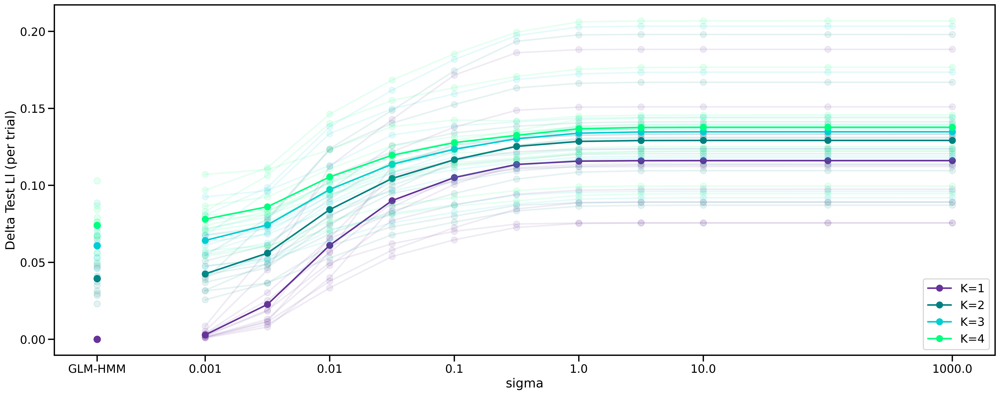

In [6]:
# Plotting one plot with all animals
fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
fig.tight_layout()
for K in range(1,5):
    for idx in range(0, len(subjectsWitten)):
        subject = subjectsWitten[idx]
        plot_testLl_CV_sigma(testLlAll[K-1][idx], sigmaList=sigmaList, label=None, color=colormap[K-1], axes=axes, alpha=0.1)
    plot_testLl_CV_sigma(np.mean(testLlAll[K-1], axis=0), sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes, alpha=1)
    axes.set_ylabel("Delta Test Ll (per trial)")
    

Text(11.25, 0.5, 'Delta Test Ll (per trial)')

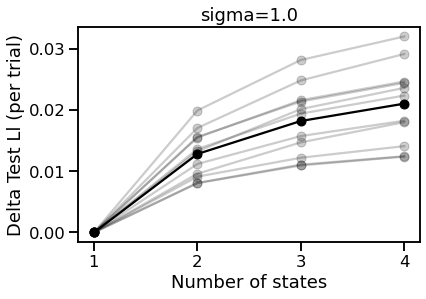

In [7]:
fig, axes = plt.subplots(1,figsize=(6,4))
fig.tight_layout()
for idx in range(0, len(subjectsWitten)):
    axes.plot([1,2,3,4],bestTestLl[:,idx],'-o', color='black',alpha=0.2)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestLl, axis=1), '-o', color='black',alpha=1)
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('Number of states')
axes.set_ylabel('Delta Test Ll (per trial)')


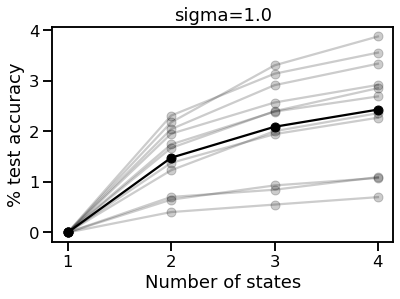

In [8]:
bestSigmaInd = 7 # Sigma to look at parameters for
accuracy = np.zeros((len(subjectsWitten), 4))
fig, axes = plt.subplots(1,figsize=(6,4))
fig.tight_layout()
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('Number of states')
axes.set_ylabel('% test accuracy')
for idx in range(0, len(subjectsWitten)):
    axes.plot([1,2,3,4],bestTestAccuracy[:,idx],'-o', color='black',alpha=0.2)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestAccuracy, axis=1), '-o', color='black',alpha=1)

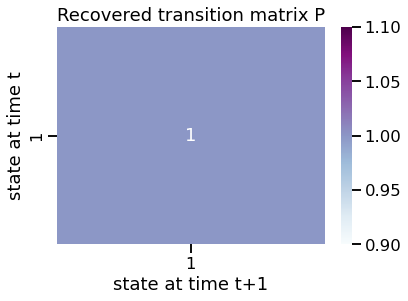

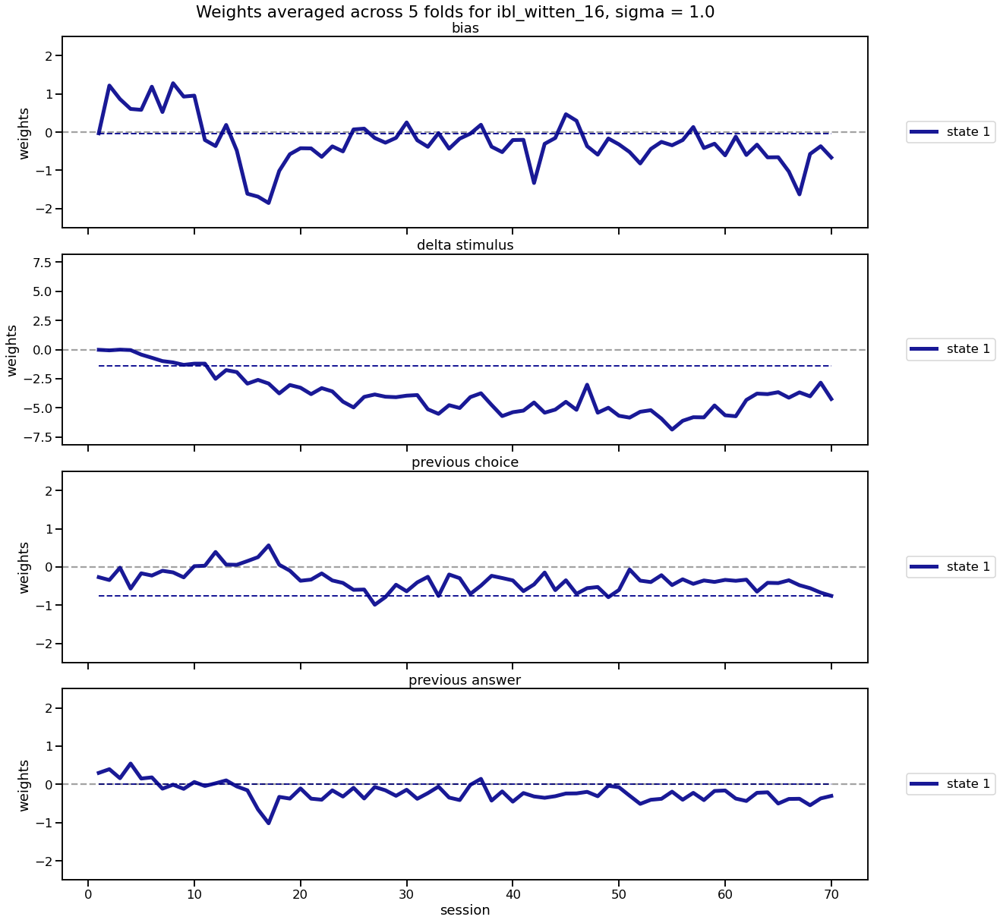

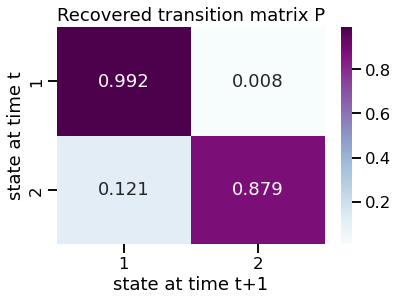

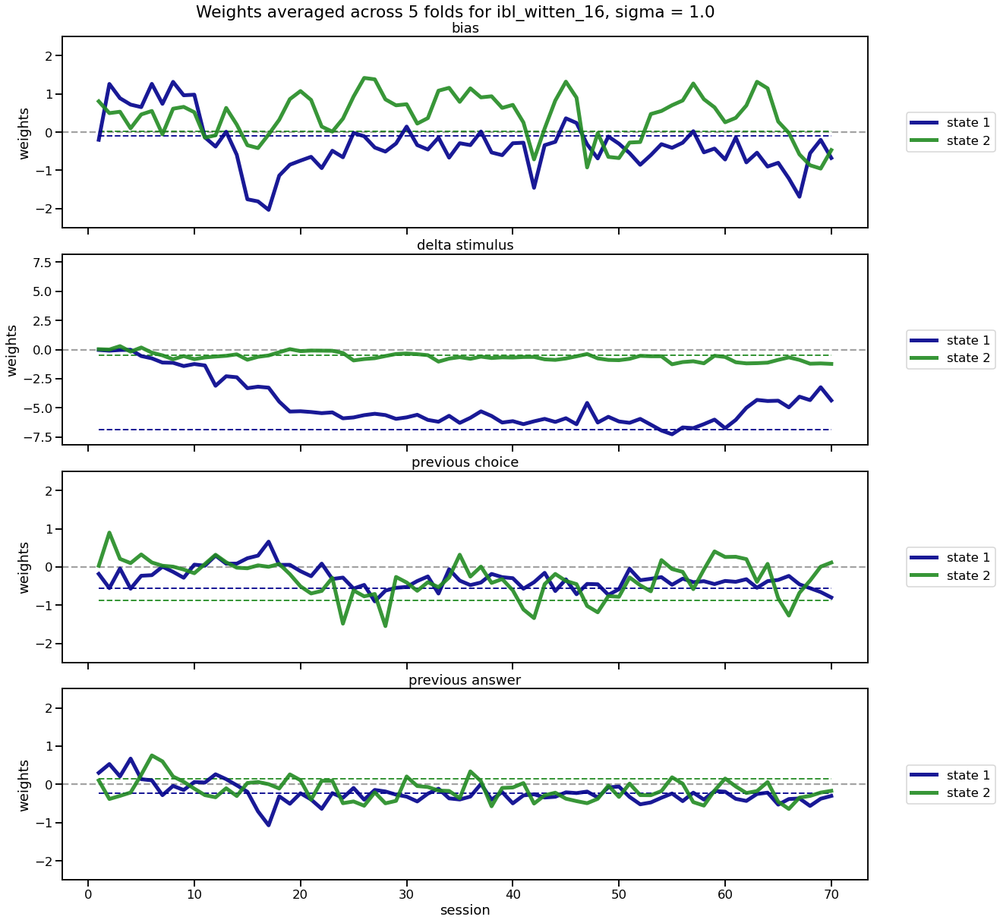

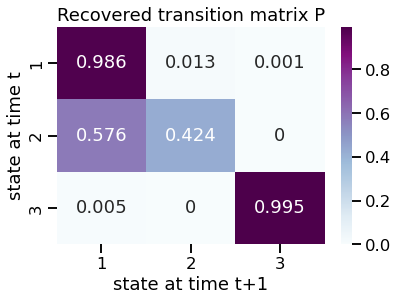

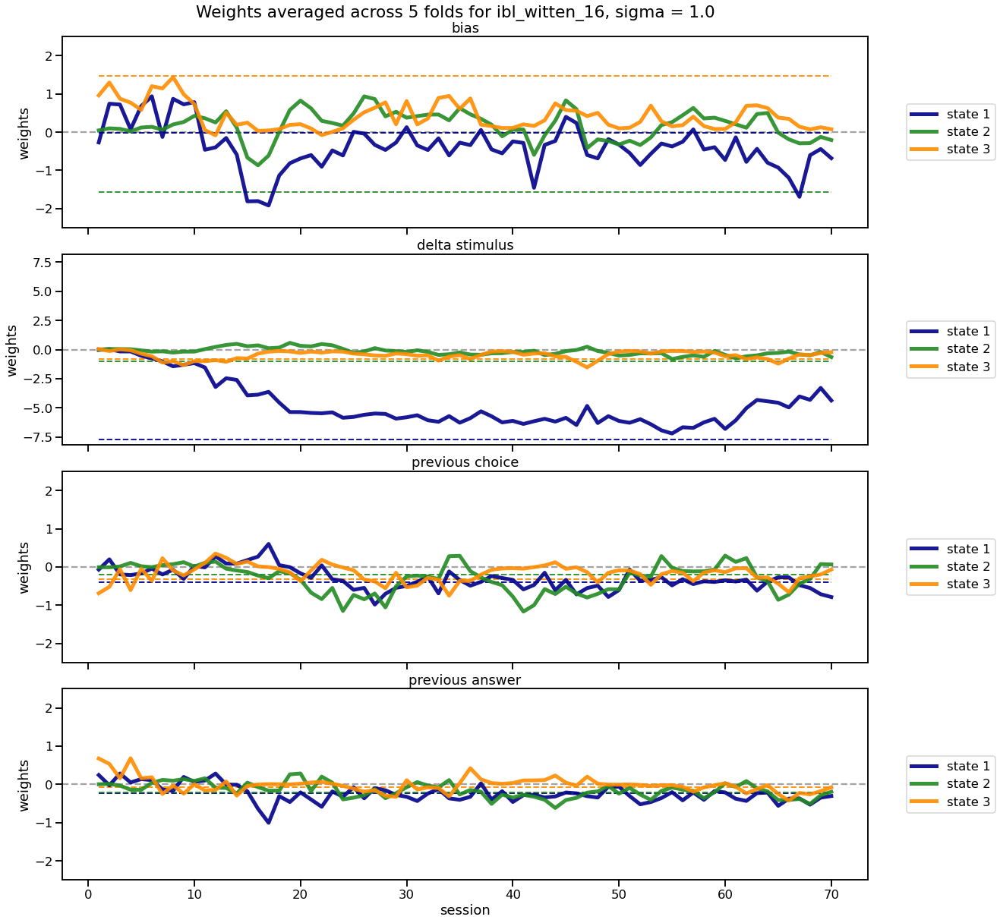

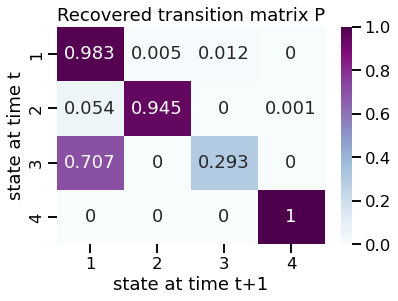

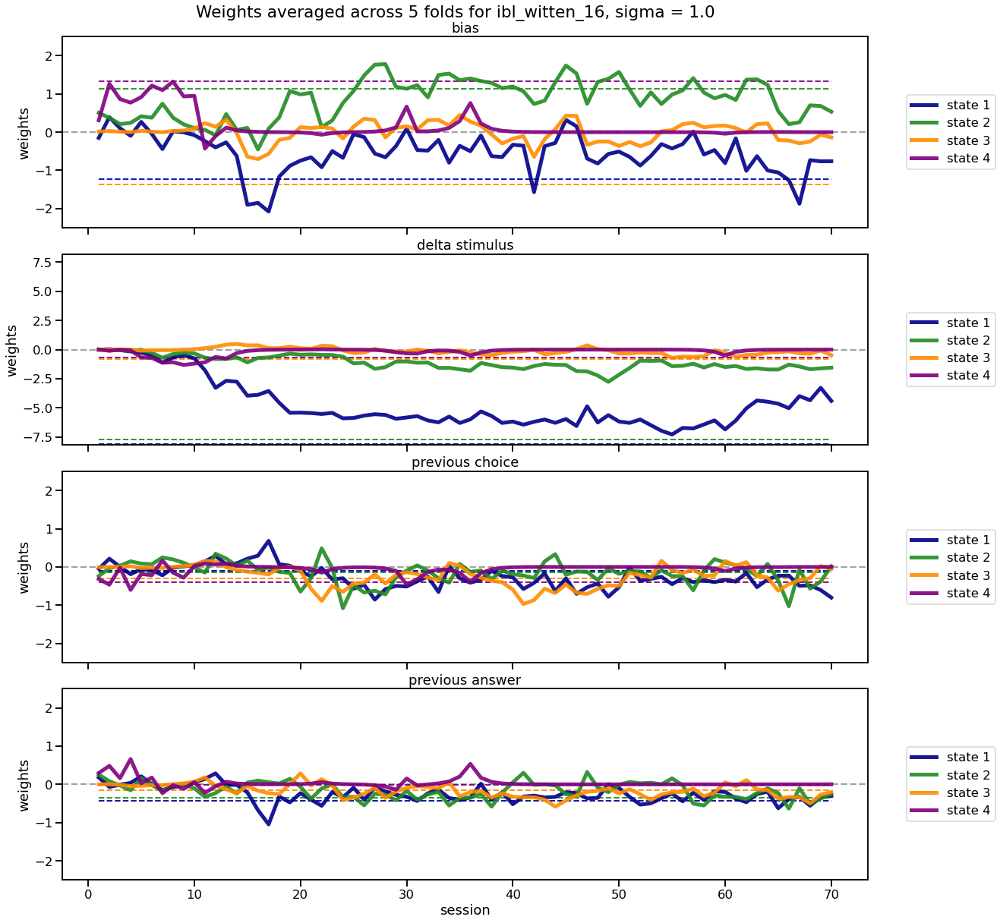

In [37]:
# Plotting Weights
bestSigmaInd = 7
for subject in ['ibl_witten_16']:#subjectsWitten:
    _, _, sessInd = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    avgP = []
    avgW = []
    avgW0 = []

    for K in [1,2,3,4]:#,3,4]: #[1,2,3]:
        trainSessInd = []
        allW = [] 
        allW0 = [] 
        allP = [] 

        for fold in range(0, splitFolds):
            allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW0.append(allW[0][0]) # standard GLM-HMM is the same across folds

            # # plotting transition matrix individually 
            # fig, axes = plt.subplots()
            # plot_transition_matrix(allP[fold][bestSigmaInd], sortedStateInd=None) # not sorted

            # # plotting weights for each fold individually
            # fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
            # fig.suptitle(f'{subject}: sigma = {np.round(sigmaList[bestSigmaInd],2)} fold {fold}')
            # fig.tight_layout()
            # plotting_weights_per_feature(allW[fold][bestSigmaInd], sessInd, axes, yLim=[[-2.5,2.5],[-6.2,6.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', sortedStateInd=None)
        
        avgP.append(np.mean(allP[:], axis=0))
        avgW.append(np.mean(allW[:], axis=0)) 
        avgW0.append(np.mean(allW0[:], axis=0))  

        # plotting transition matrix averaged across folds
        fig, axes = plt.subplots()
        plot_transition_matrix(avgP[K-1][bestSigmaInd], sortedStateInd=None) # not sorted
            
        fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
        fig.suptitle(f'Weights averaged across 5 folds for {subject}, sigma = {np.round(sigmaList[bestSigmaInd],2)}')
        fig.tight_layout()
        plotting_weights_per_feature(avgW0[K-1], sessInd, axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=2, linestyle='--', sortedStateInd=None, legend=False)
        plotting_weights_per_feature(avgW[K-1][bestSigmaInd], sessInd, axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', sortedStateInd=None)
    #         fig, axes = plt.subplots(K, 1,figsize=(16,4*K+1), sharex=True)
    #         plotting_weights_IBL(avgW0[K-1], sessInd, axes, yLim=[-7,7], colors=colorsFeatures[D%2], labels=[None for x in range(0,D)], linewidth=4, linestyle='--', legend=False)
    #         plotting_weights_IBL(avgW[K-1][bestSigmaInd], sessInd, axes, yLim=[-7,7], colors=colorsFeatures[D%2], labels=myFeatures[D%2], legend=True)
    # #         
    


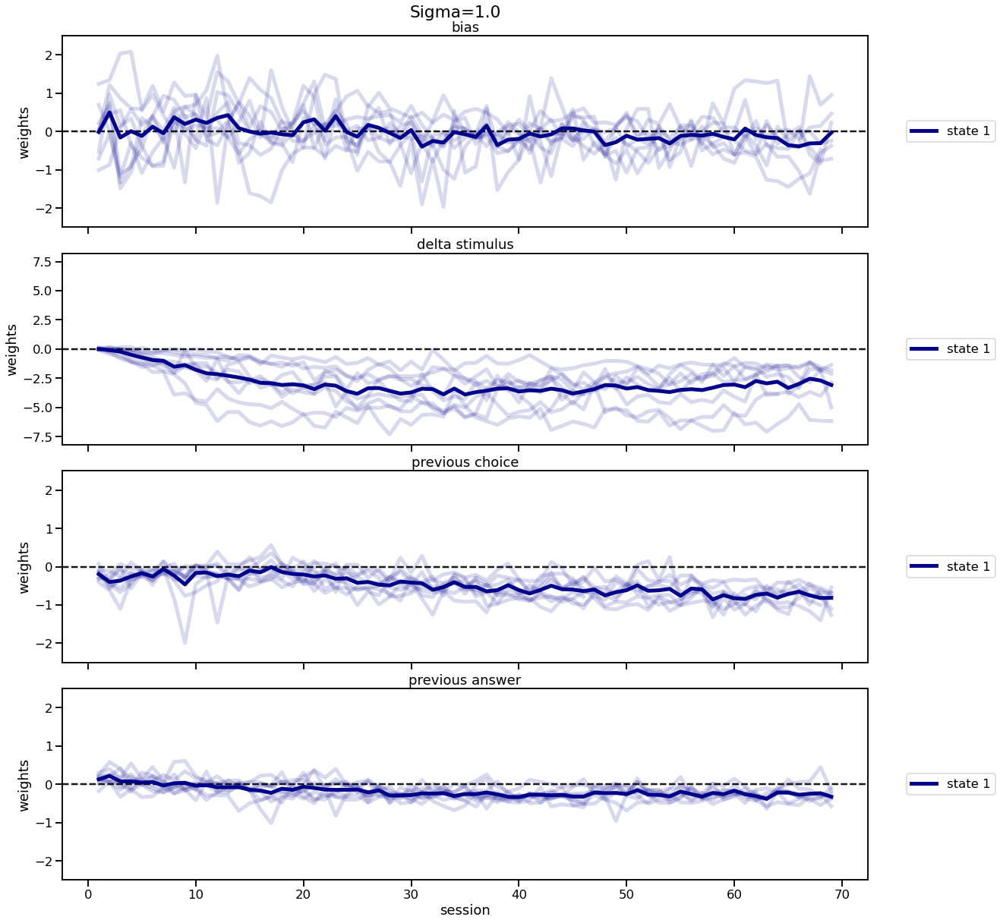

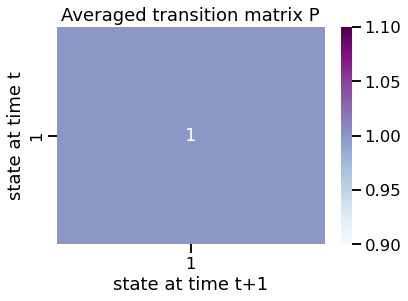

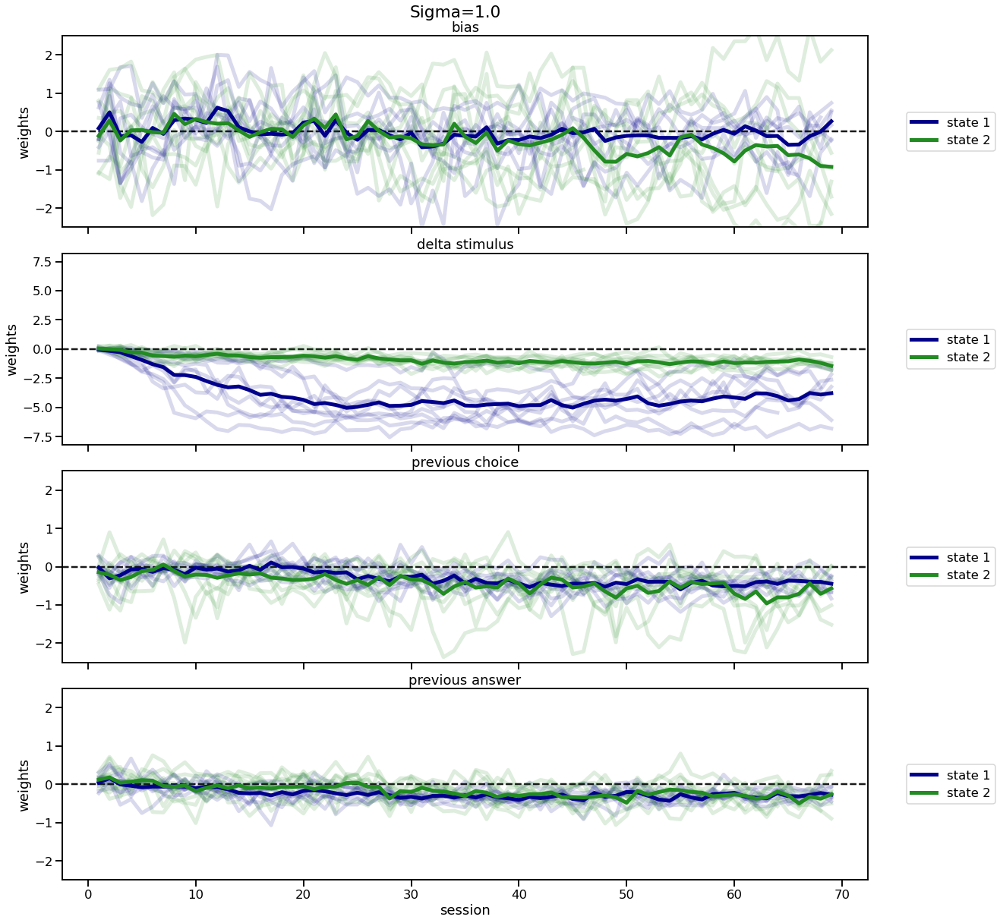

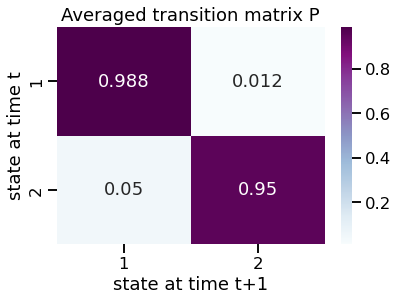

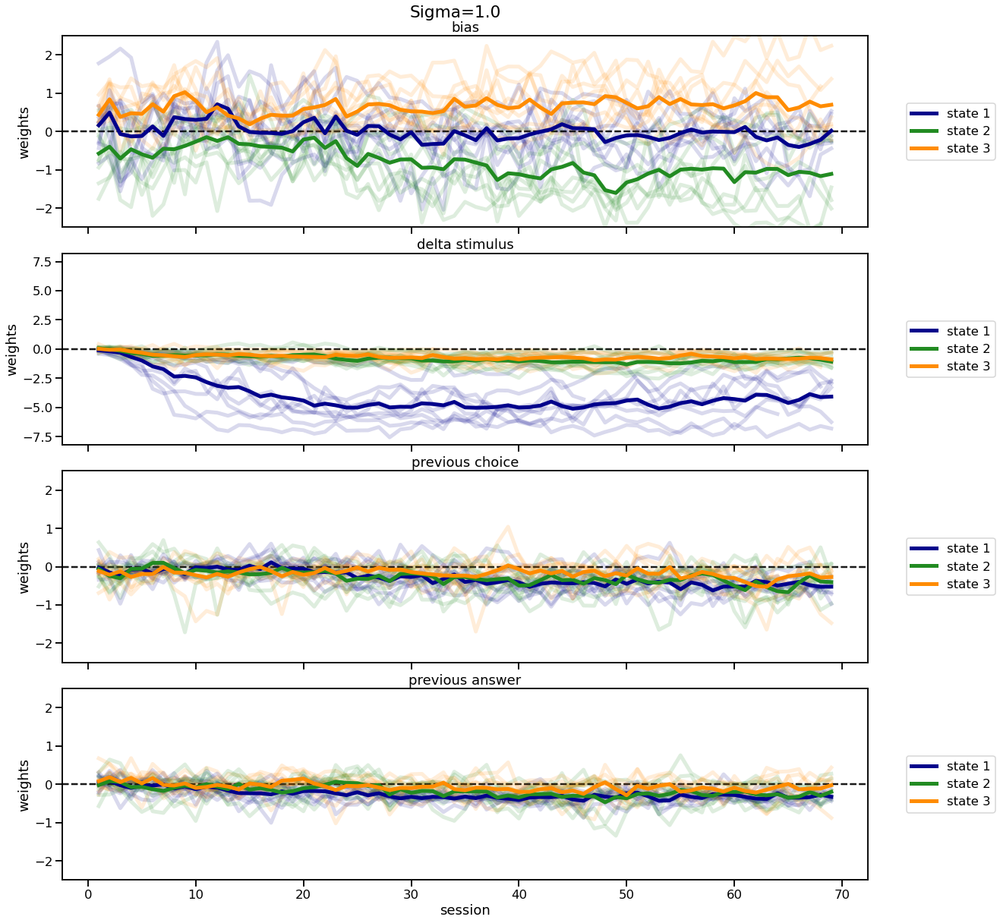

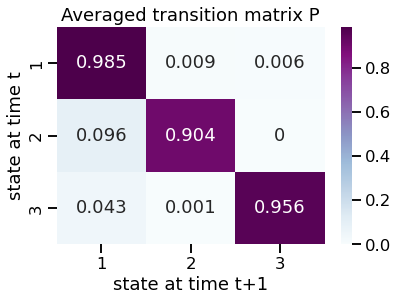

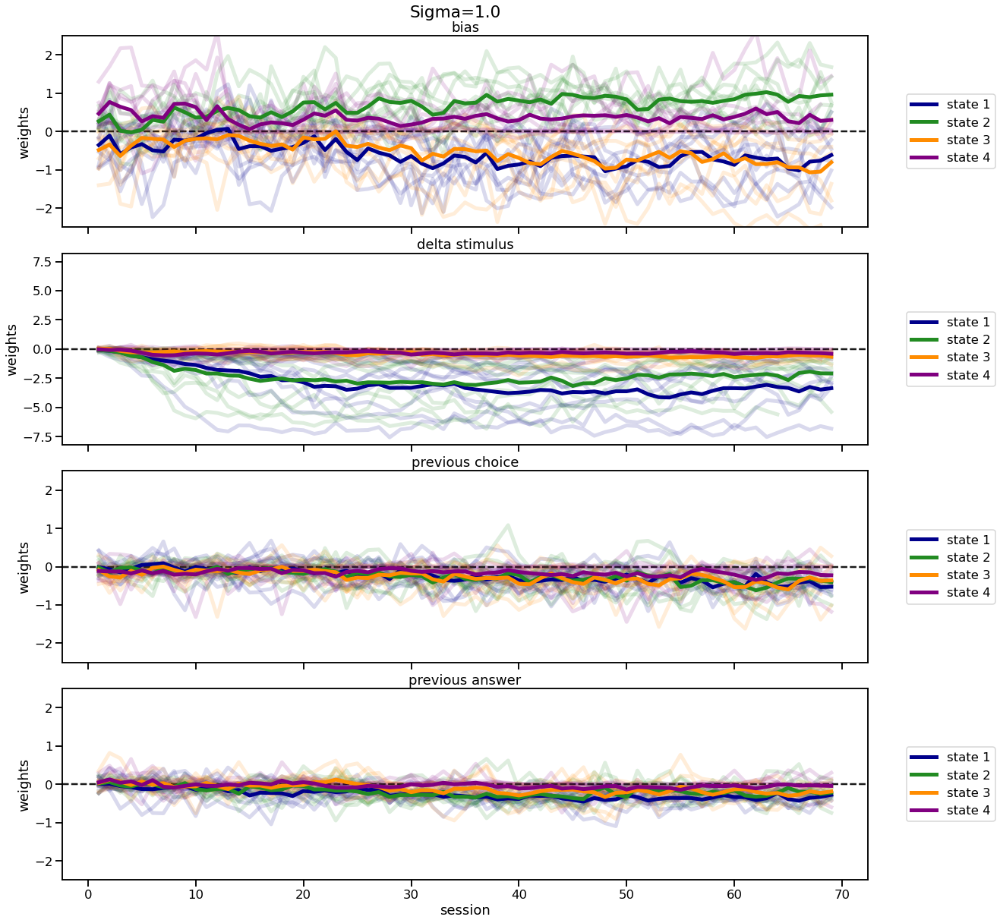

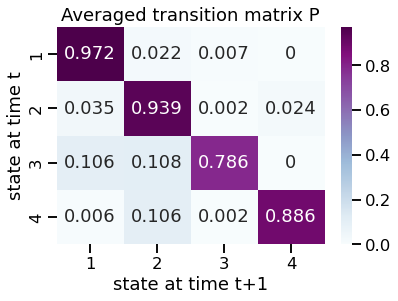

In [9]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions (Exception ibl_witten_02 and 03)
maxSess = 70

bestSigmaInd = 7
for K in [1,2,3,4]:
    arr = np.ma.empty((maxSess, K, D, 2, len(subjectsWitten)-2))
    arr.mask = True

    fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
    fig.suptitle(f'Sigma={sigmaList[bestSigmaInd]}')
    fig.tight_layout()

    avgP = np.zeros((len(subjectsWitten)-2, K, K))
    avgW = []
            
    for idx in range(0,len(subjectsWitten)-2):
        subject = subjectsWitten[idx+2] # skipping animals '02' and '03'
        _, _, sessInd = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        allW = [] 
        allP = [] 

        for fold in range(0, splitFolds):
            allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
        
        avgP[idx]=np.mean(allP[:], axis=0)[bestSigmaInd]
        avgW.append(np.mean(allW[:], axis=0)[bestSigmaInd, sessInd[:-1]]) 

        stop = min(avgW[idx].shape[0], maxSess)
        arr[:stop, :K, :D, :2, idx] = avgW[idx][:stop]
        plotting_weights_per_feature(avgW[idx][:stop], [x for x in range (0, stop)], axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', alpha=0.15, legend=False, sortedStateInd=None)
        
    plotting_weights_per_feature(arr.mean(axis=4), [x for x in range (0, maxSess)], axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', alpha=1, legend=True, sortedStateInd=None)

    # plotting transition matrix averaged across folds
    fig, axes = plt.subplots()
    plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted
                
    

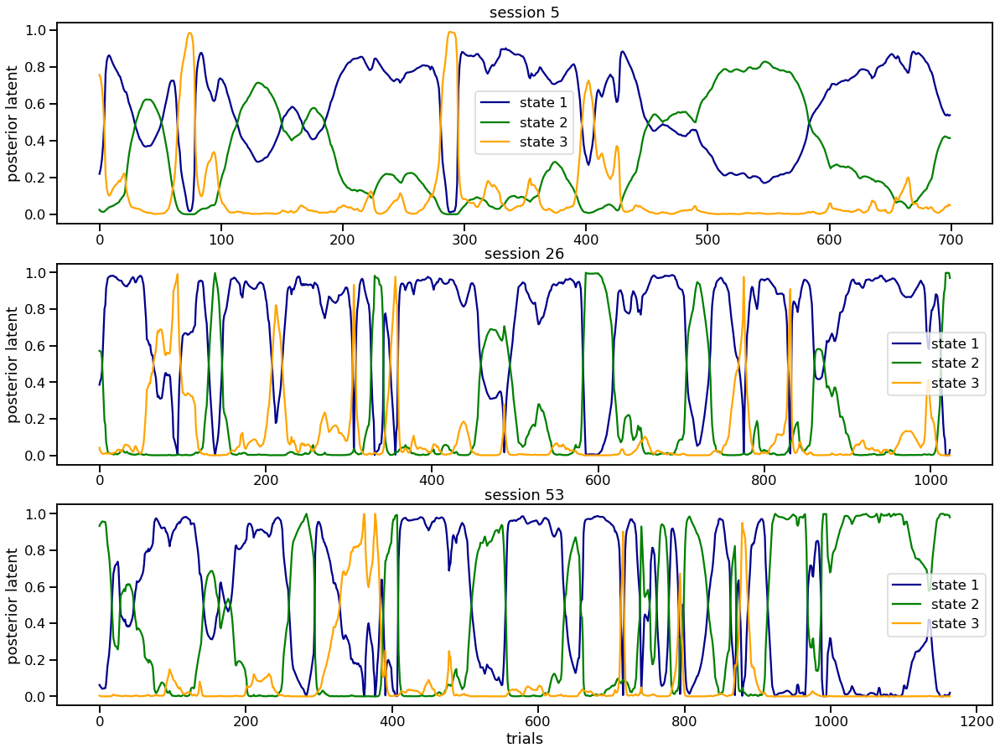

In [29]:
# Plotting Posterior Latents for example sessions
truepi = np.ones((K))/K
bestSigmaInd = 6
for subject in ['ibl_witten_15']: #[0, 1]:#range(0, len(subjectsWitten)):
    x, y, sessInd = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    N = x.shape[0]
    avgP = []
    avgW = []
    
    K = 3
        
    allW = [] 
    allP = [] 
    for fold in range(0, splitFolds):
        allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
        allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
        allW[fold] = allW[fold][bestSigmaInd]
        allP[fold] = allP[fold][bestSigmaInd]
        
    avgP = np.mean(allP[:], axis=0)
    avgW = np.mean(allW[:], axis=0)
        
    dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,K,D,2)
    present = np.ones((N))

    # plotting latents for parameters averaged across folds
    gamma = dGLM_HMM.get_posterior_latent(avgP, truepi, avgW, x, y, present, sessInd, sortedStateInd=None)
    plot_posteior_latent(gamma, sessInd, sessions = [5,26,53])

    # # plotting latent for individual folds
    # fold = 0
    # gamma = dGLM_HMM.get_posterior_latent(allP[fold], truepi, allW[fold], x, y, present, sessInd, sortedStateInd=None)
    # plot_posteior_latent(gamma, sessInd, sessions = [5,26,53])


In [ ]:
# Plotting psycometrics for example sessions

In [12]:
# Saving best sigma Ind
bestSigmaInd = 7
for subject in subjectsWitten: #[0, 1]:#range(0, len(subjectsWitten)):
    for K in [1,2,3,4]:
        allP = []
        allW = []
        for fold in range(0, splitFolds):
            allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW[fold] = allW[fold][bestSigmaInd]
            allP[fold] = allP[fold][bestSigmaInd]
            
        avgP = np.mean(allP[:], axis=0)
        avgW = np.mean(allW[:], axis=0)

        np.save(f'../data_IBL/{subject}_bestP_D={D}_{K}_state_CV_sigma=1_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}', avgP)
        np.save(f'../data_IBL/{subject}_bestW_D={D}_{K}_state_CV_sigma=1_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}', avgW)
        

(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)
(1, 1)
(2, 2)
(3, 3)
(4, 4)


# Sigma 2D Analysis 

In [10]:
# setting hyperparameters
sigmaList = [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10]
L2penaltyW = 1
priorDirP = None
maxiter = 300
splitFolds = 5
fitFolds = 3

D = 4 # number of features
sessStop = -1 # last session to use in fitting

best index fo K=1 animal ibl_witten_02 is  (6, 6)
best index fo K=2 animal ibl_witten_02 is  (8, 7)
best index fo K=3 animal ibl_witten_02 is  (7, 7)
best index fo K=4 animal ibl_witten_02 is  (6, 8)
best index fo K=1 animal ibl_witten_03 is  (8, 8)
best index fo K=2 animal ibl_witten_03 is  (8, 8)
best index fo K=3 animal ibl_witten_03 is  (7, 8)
best index fo K=4 animal ibl_witten_03 is  (8, 8)


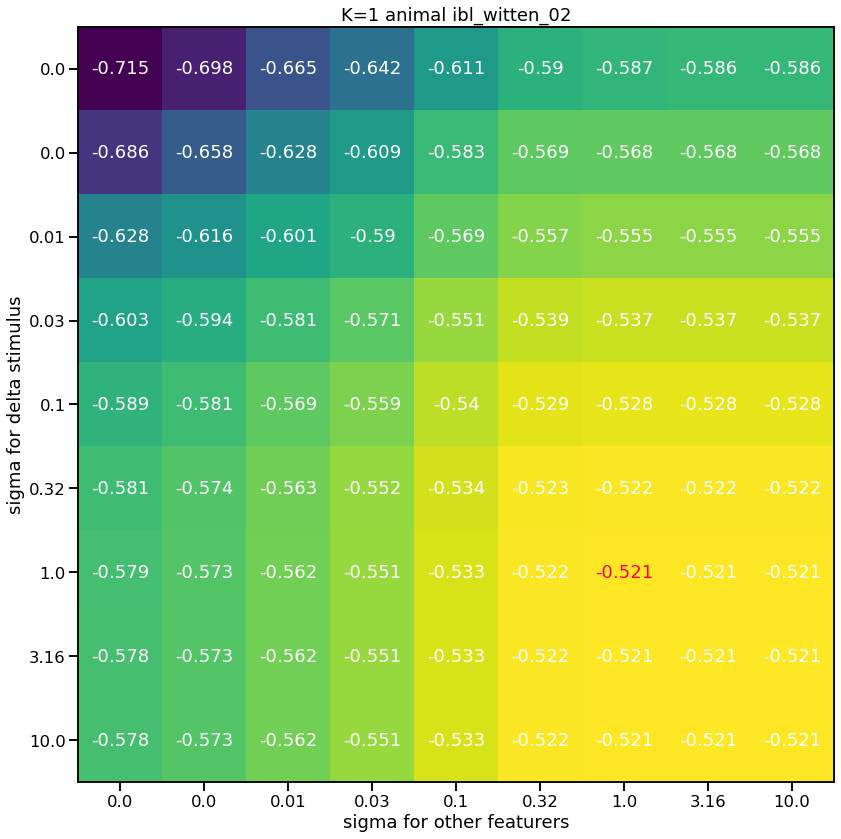

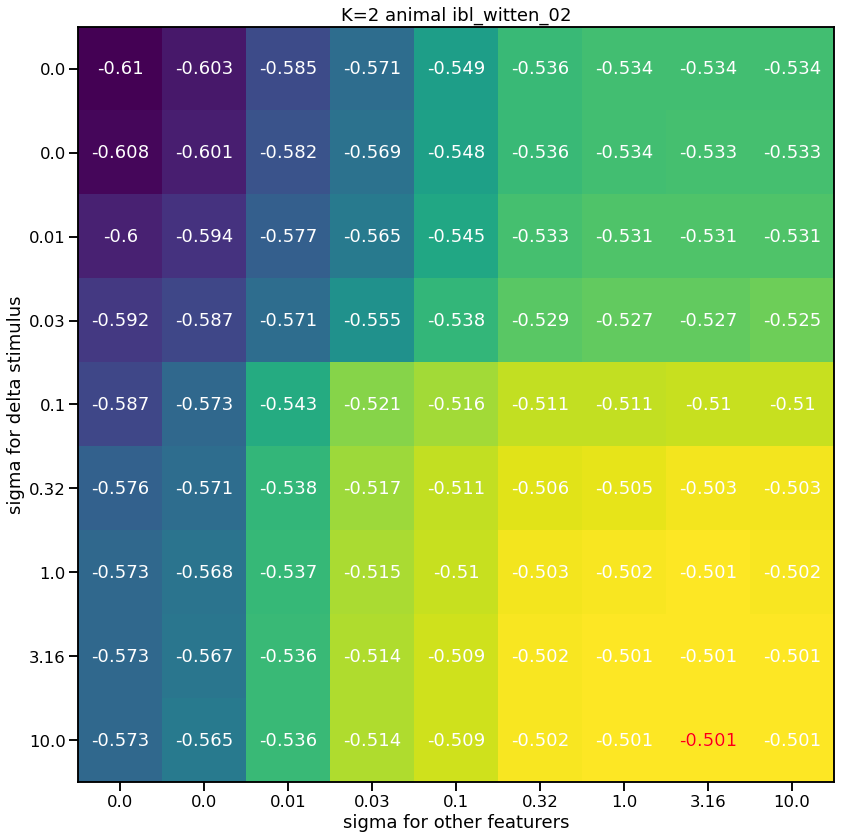

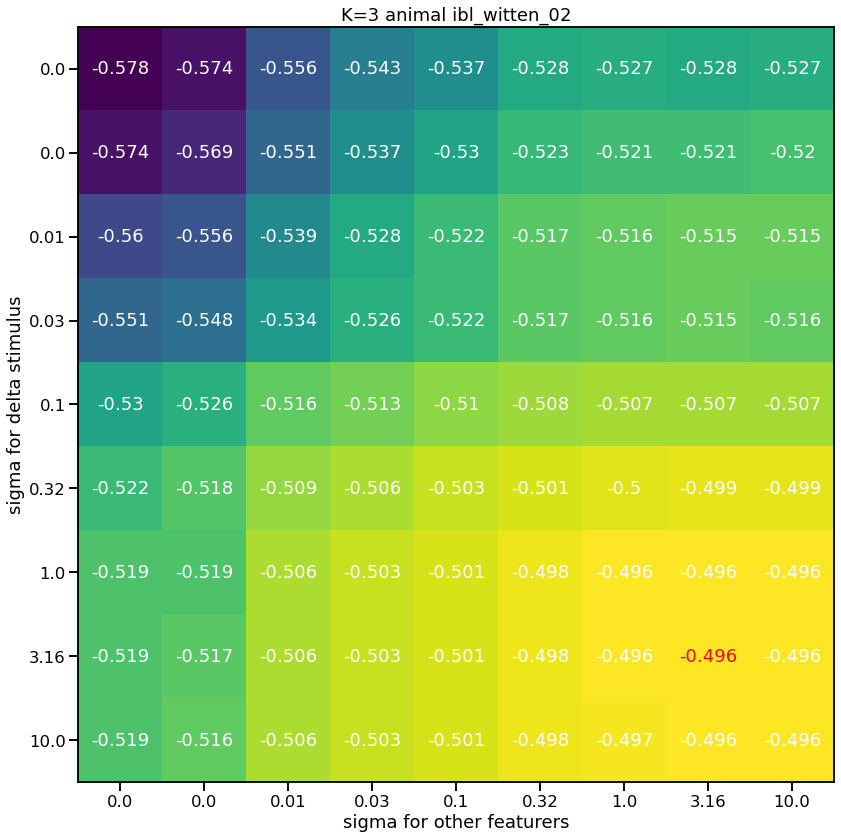

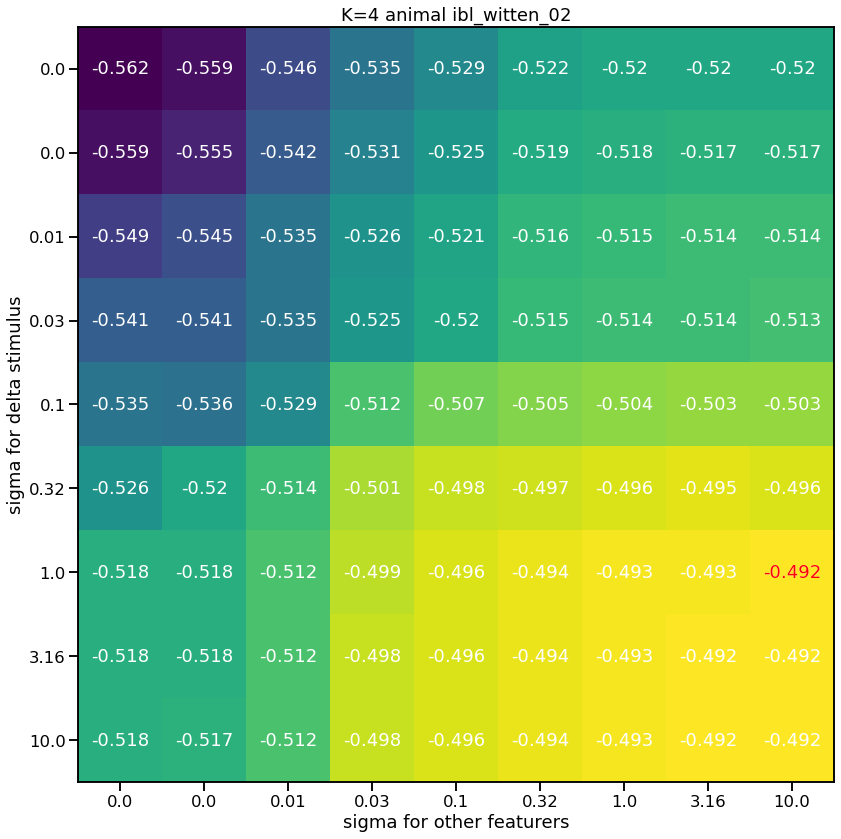

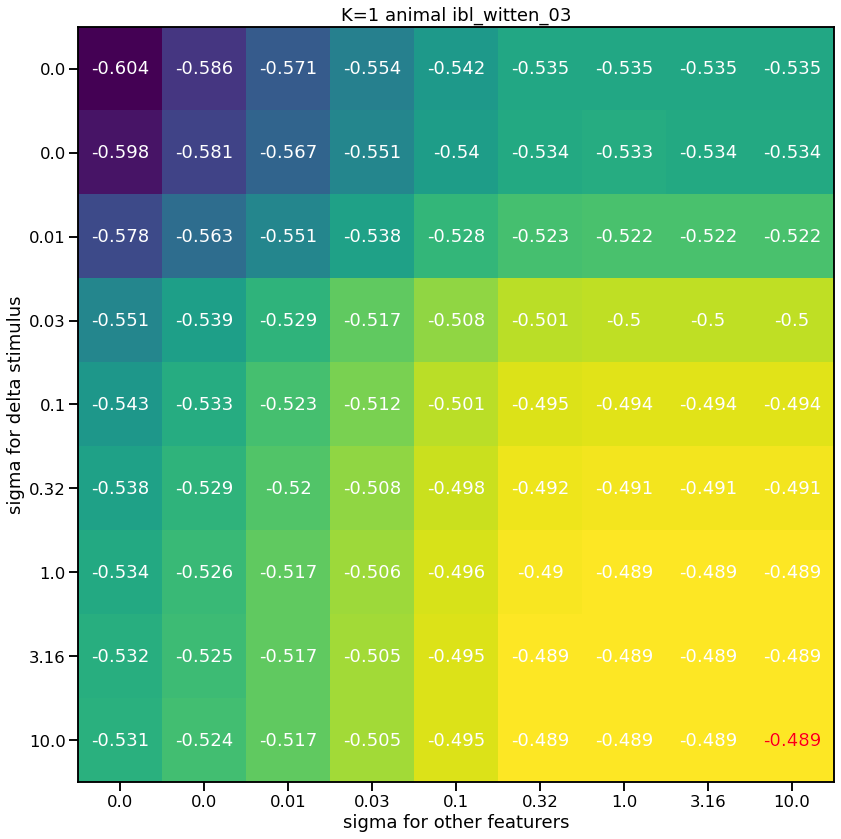

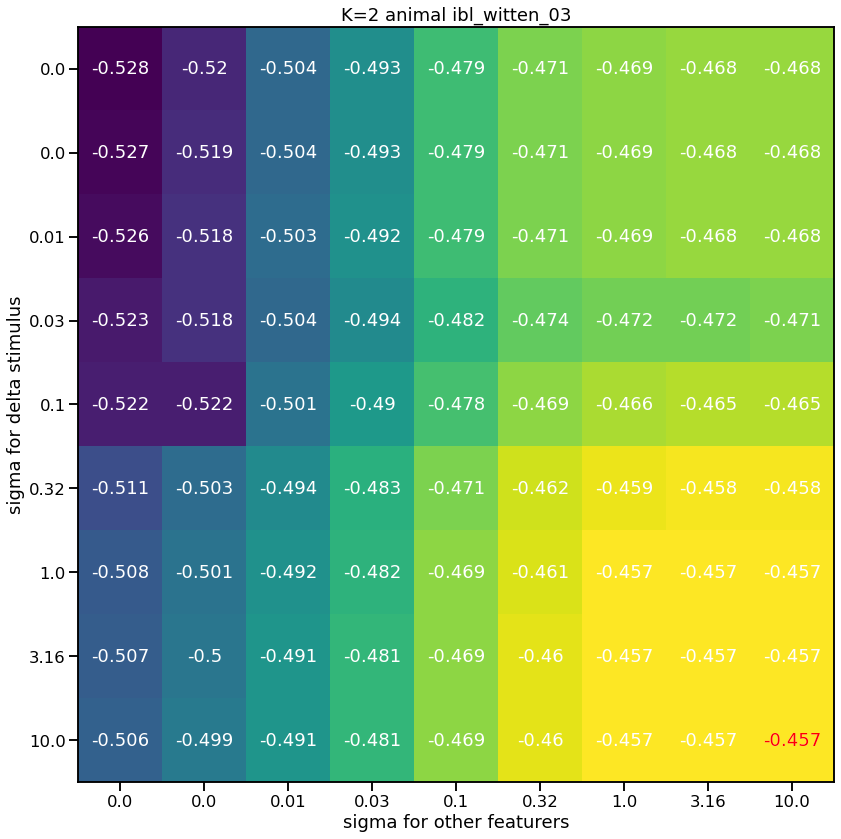

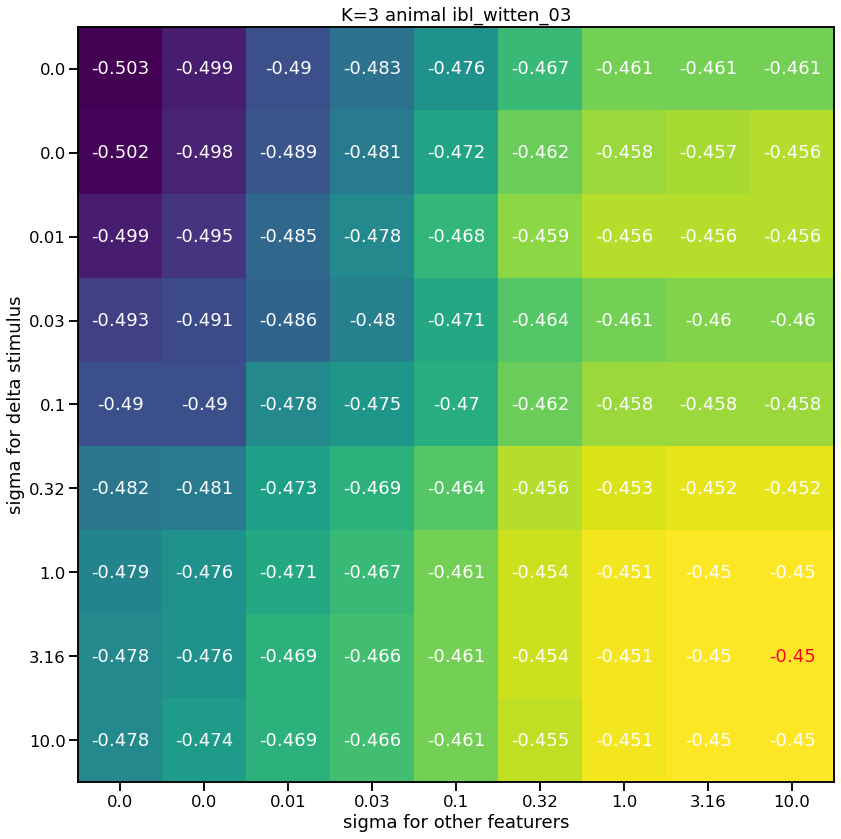

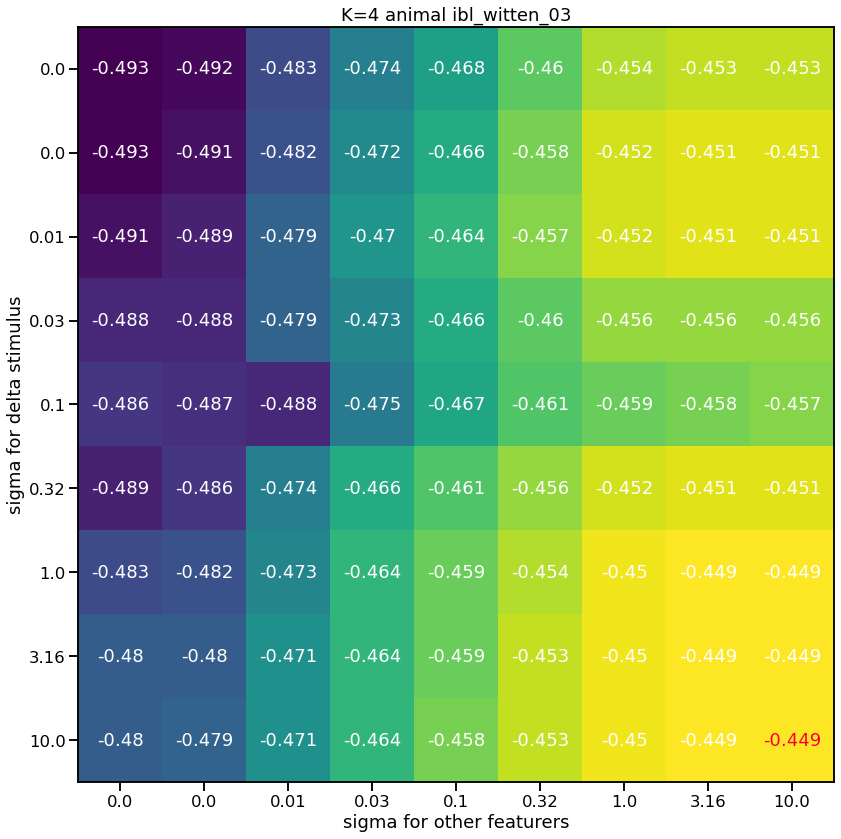

In [14]:
testLlAll = np.zeros((4, len(subjectsWitten), len(sigmaList), len(sigmaList)))
bestTestLl = np.zeros((4,11))
bestIndAll = np.empty((4, len(subjectsWitten)), dtype=object)

for idx in [0,1]:#range(0, len(subjectsWitten)):
    subject = subjectsWitten[idx]
    testLl = []
    allP = [] 
    allW = [] 
    trainSessInd = []
    avgTestLl = []
    for K in [1,2,3,4]:
        for fold in range(0, fitFolds):
            testLl = np.load(f'../data_IBL/{subject}/{subject}_testLl_D={D}_{K}_state_fold-{fold}_sigmas2D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy')
            testLlAll[K-1, idx] += testLl
        testLlAll[K-1, idx] = testLlAll[K-1, idx]/fitFolds
        
        fig, ax = plt.subplots(figsize=(12,12))
        ax.set_title(f'K={K} animal {subject}')
        im = ax.imshow(np.round(testLlAll[K-1, idx], 3))
        ax.set_xticks(np.arange(len(sigmaList)), labels=np.round(sigmaList,2))
        ax.set_yticks(np.arange(len(sigmaList)), labels=np.round(sigmaList,2))
        for i in range(len(sigmaList)):
            for j in range(len(sigmaList)):
                text = ax.text(j, i, np.round(testLlAll[K-1, idx, i, j], 3),
                            ha="center", va="center", color="w")
        
        bestIndAll[K-1, idx] = np.unravel_index(np.argmax(testLlAll[K-1, idx], axis=None), testLlAll[K-1, idx].shape)
        print(f'best index fo K={K} animal {subject} is ', bestIndAll[K-1, idx])
        text = ax.text(bestIndAll[K-1, idx][1], bestIndAll[K-1, idx][0], np.round(testLlAll[K-1, idx, bestIndAll[K-1, idx][0], bestIndAll[K-1, idx][1]], 3),
                            ha="center", va="center", color="red")

        ax.set_ylabel('sigma for delta stimulus')
        ax.set_xlabel('sigma for other featurers')
        fig.tight_layout()


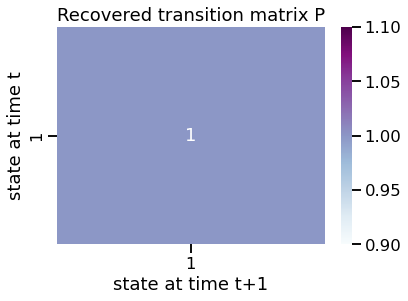

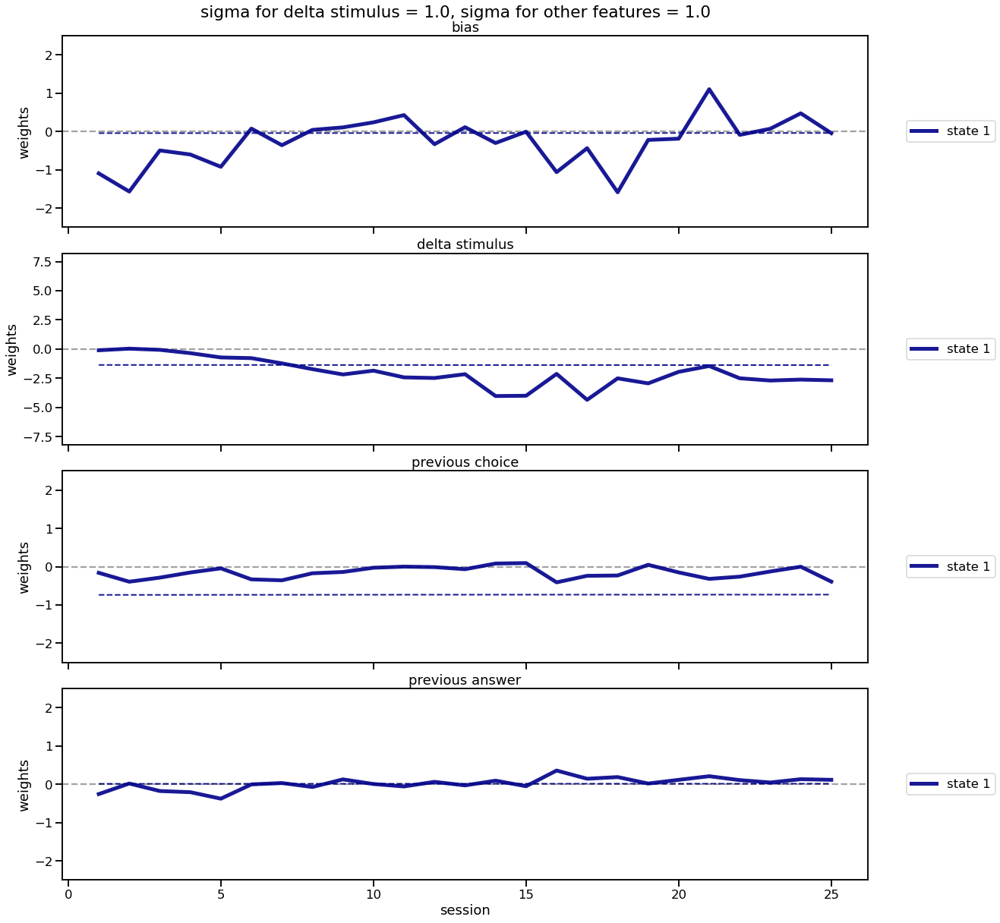

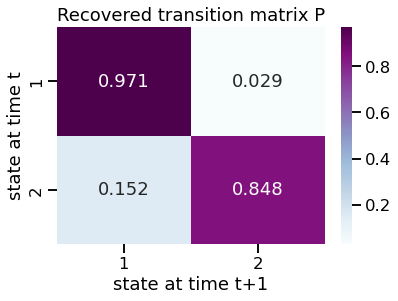

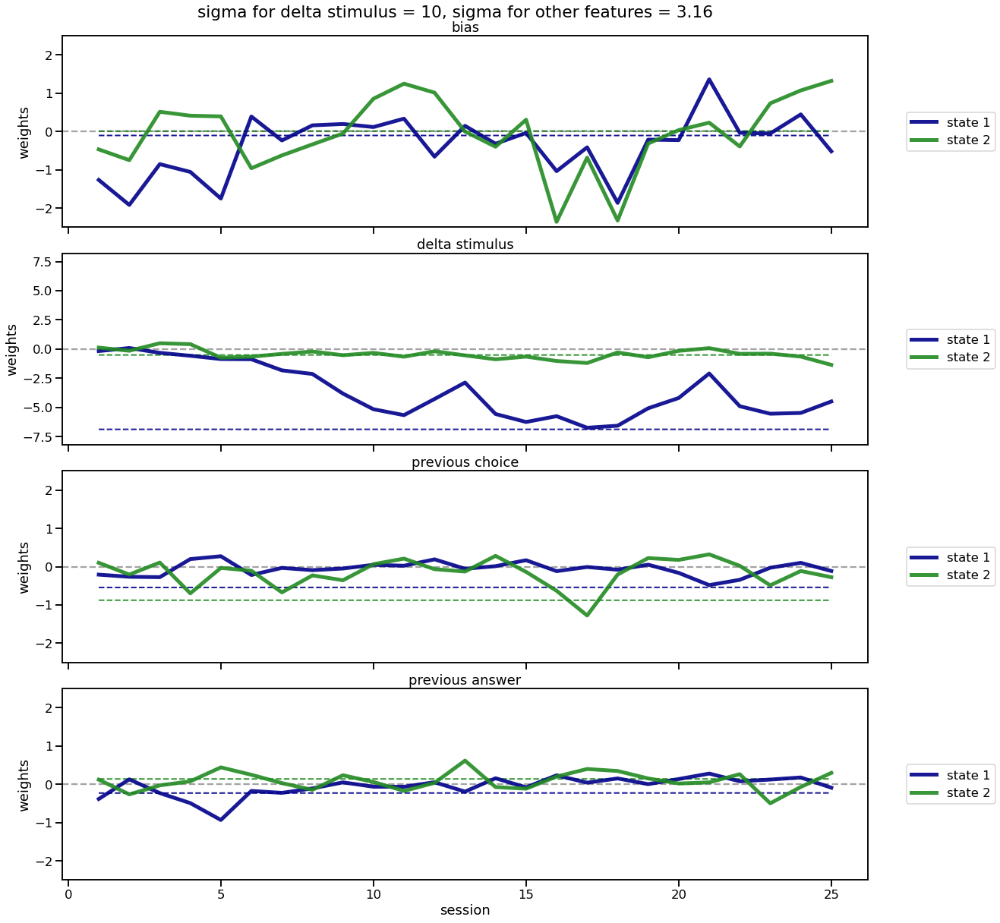

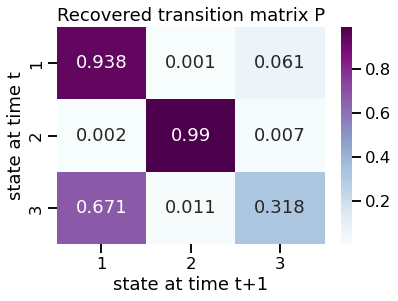

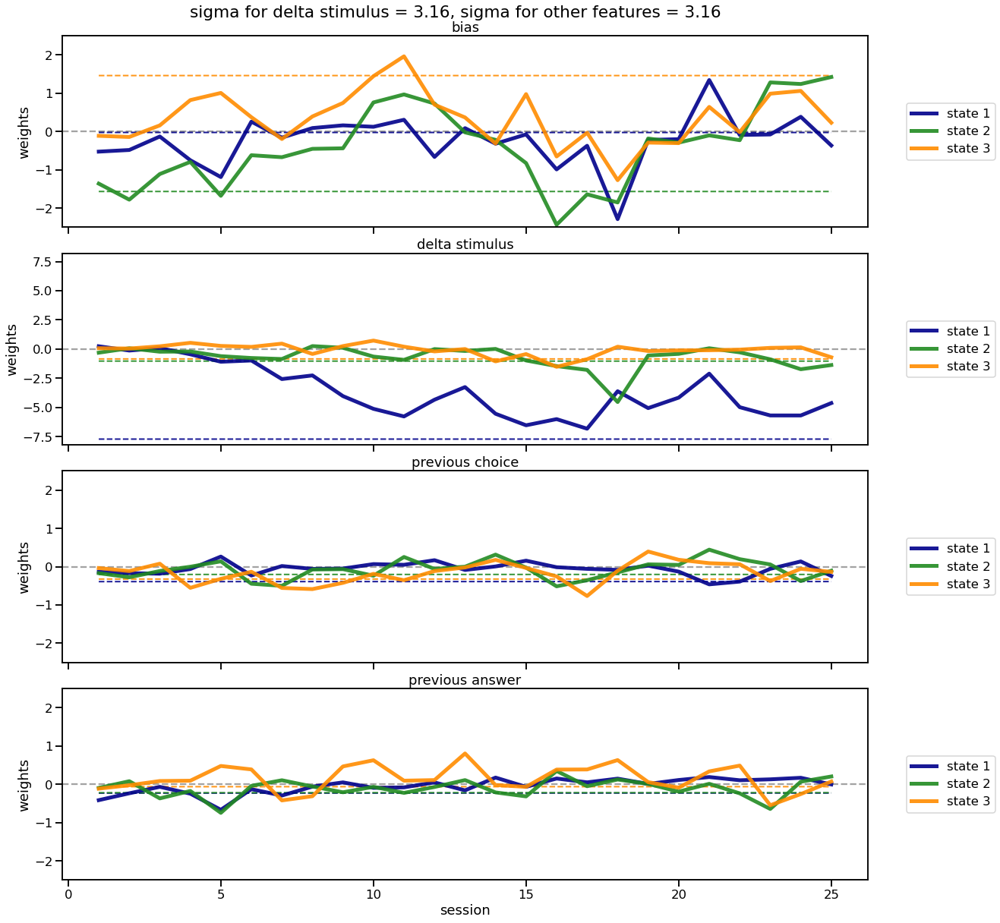

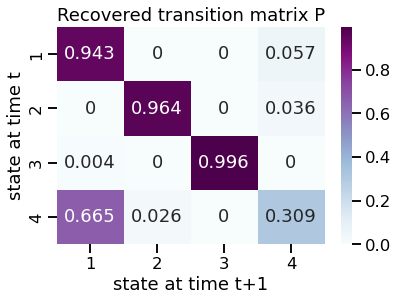

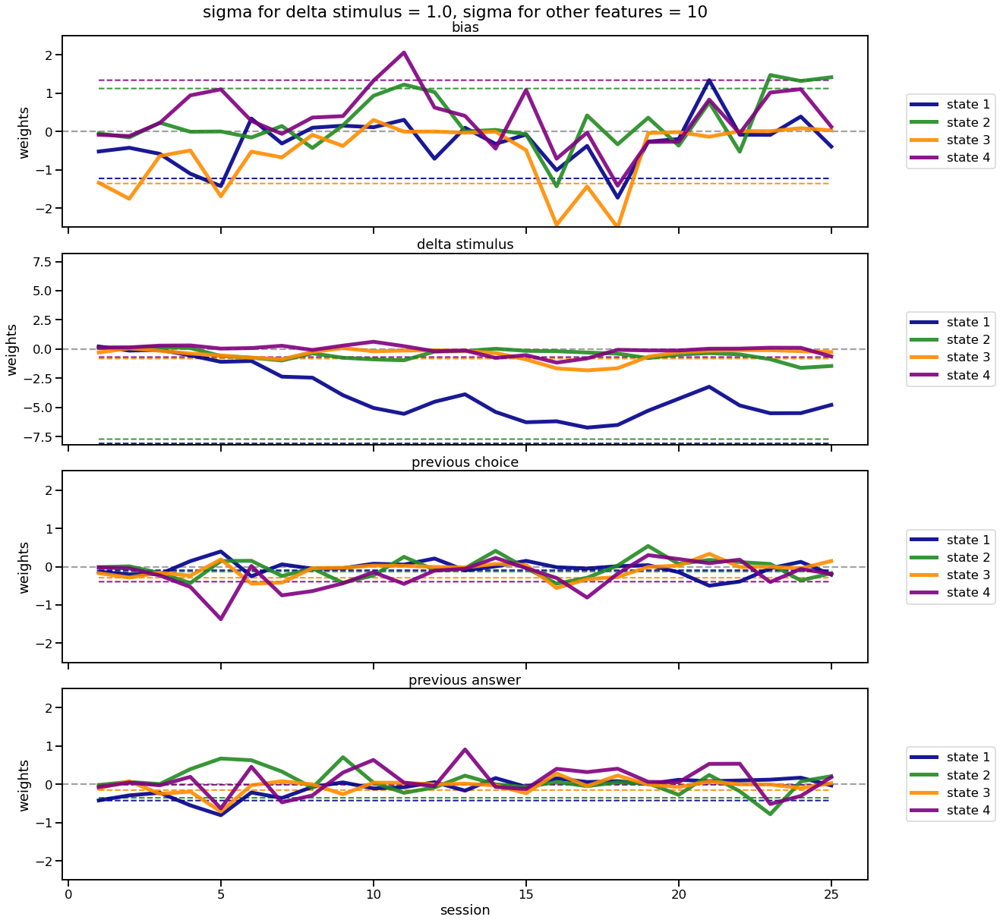

In [19]:
# Plotting Weights

for subject in ['ibl_witten_03']: #[0, 1]:#range(0, len(subjectsWitten)):
    _, _, sessInd = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    avgP = []
    avgW = []
    avgW0 = []
    for K in [1,2,3,4]: #[1,2,3]:
        bestSigmaInd = bestIndAll[K-1][0] # first animal
        allW = [] 
        allW0 = [] 
        allP = [] 
        for fold in range(0, fitFolds):
            allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas2D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas2D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
            allW0.append(allW[fold][0,0])
            allW[fold] = allW[fold][bestSigmaInd]
            allP[fold] = allP[fold][bestSigmaInd]

            # # plotting transition matrix individually 
            # fig, axes = plt.subplots()
            # plot_transition_matrix(allP[fold][bestSigmaInd], sortedStateInd=None) # not sorted

            # # plotting weights for each fold individually
            # fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
            # fig.suptitle(f'{subject}: sigma = {np.round(sigmaList[bestSigmaInd],2)} fold {fold}')
            # fig.tight_layout()
            # plotting_weights_per_feature(allW[fold], trainSessInd[0], axes, yLim=[[-2.5,2.5],[-6.2,6.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', sortedStateInd=None)
        
        avgP.append(np.mean(allP[:], axis=0))
        avgW.append(np.mean(allW[:], axis=0))   

        
        # plotting transition matrix averaged across folds
        fig, axes = plt.subplots()
        plot_transition_matrix(avgP[K-1], sortedStateInd=None) # not sorted

        # plotting weights averaged across folds
        avgW0.append(np.mean(allW0[:], axis=0))
        fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
        fig.suptitle(f'sigma for delta stimulus = {np.round(sigmaList[bestSigmaInd[0]],2)}, sigma for other features = {np.round(sigmaList[bestSigmaInd[1]],2)}')
        fig.tight_layout()
        plotting_weights_per_feature(avgW0[K-1], sessInd, axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=2, linestyle='--', sortedStateInd=None, legend=False)
        plotting_weights_per_feature(avgW[K-1], sessInd, axes, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', sortedStateInd=None)
        

In [34]:
# def mega_figure1(subject, K, sigmaInd, save_fig=False):
#     ''' 
#     create mega figure per animal to look at different plots simultaneously
#     '''

#     _, _, sessInd = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    
#     allP = []
#     allW = []
#     allW0 = []

#     for fold in range(0, splitFolds):
#         allP.append(np.load(f'../data_IBL/{subject}/{subject}_P_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
#         allW.append(np.load(f'../data_IBL/{subject}/{subject}_W_D={D}_{K}_state_fold-{fold}_sigmas1D_L2penaltyW={L2penaltyW}_priorDirP={priorDirP}_untilSession{sessStop}.npy'))
#         allW0.append(allW[0][0]) # standard GLM-HMM is the same across folds

#     # averaging across folds      
#     avgP = np.mean(allP[:], axis=0)[sigmaInd]
#     avgW = np.mean(allW[:], axis=0)[sigmaInd]
#     avgW0 = np.mean(allW0[:], axis=0)

#     fig = plt.figure(figsize=(20,11))

#     # ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=3, rowspan=1)
#     # plot_transition_matrix(avgP[K-1][bestSigmaInd], sortedStateInd=None) # not sorted
    
#     sess = len(sessInd) - 1
#     for d in range(0, D):
#         axes = plt.subplot2grid((20, 20), (3*d, 0), colspan=6, rowspan=2)
#         for k in range(0,K):
#             axes.plot(range(1,sess+1),avgW0[sessInd[:-1],k,d,1],color=colorsStates[k],linewidth=5,label=myFeatures[D%2], alpha=0.8, linestyle='-')
#         axes.axhline(0, alpha=0.2, color='black',linestyle='-')
#         axes.set_ylabel("weights")
#         axes.set_title(f'{myFeatures[D%2][d]}')

#         if (d==1):
#             axes.set_ylim([-8.2,8.2])
#         else:
#             axes.set_ylim([-2.5,2.5])

#     # plotting_weights_per_feature(avgW0[K-1], sessInd, ax2, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=2, linestyle='--', sortedStateInd=None, legend=False)
#     # plotting_weights_per_feature(avgW[K-1][sigmaInd], sessInd, ax2, yLim=[[-2.5,2.5],[-8.2,8.2]], colors=colorsStates, labels=myFeatures[D%2], linewidth=5, linestyle='-', sortedStateInd=None)
    
#     # if (save_fig==True):
#     #     fig.suptitle(str(rat_id)+ " - K = " + str(K))
#     #     fig.savefig(f'../figures_IBL/GLMHMM_MegaFigure1', bbox_inches='tight', dpi=300)

# mega_figure1(subject='ibl_witten_15', K=2, sigmaInd=7, save_fig=False)

    